In [2251]:
import pandas as pd
import numpy as np
from geopy.geocoders import Nominatim
import folium
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

import json 
import requests 
from pandas.io.json import json_normalize 
import matplotlib.cm as cm
import matplotlib.colors as colors

# Capstone Project - The Battle of the Neighborhoods (part 2) - week 5

## Table of contents
* [Introduction](#Introduction)
* [Data](#Data)
* [Methodology](#Methodology)
* [Analysis](#Analysis)
* [Results and Discussion](#Results)
* [Conclusion](#Conclusion)

# Introduction

London stands out as one of the most iconic cities of Europe. Developed from the British
colonialism, the city became a signature for multi-cultural society. Given the enormous size of
London, the community has many things to offer, which provide career, social and leisure
opportunities for a well-balanced daily life. However, London is also well-known because of its
high living cost, in particular the housing price. Only the few wealthiest are able to afford the
properties here. Industrial renters, on the other hand, rely on office space rentals. For many
industrial organisations, the rental expense is one of the largest expense in their balance sheet. A
wisely selected occupation space could reduce rental expense and bring logistical advantages over
competitors, which play a crucial role in the success of their business.
Estate agencies provides property recommendation services to industrial renters. Understanding the
underlying driving factors for the rental price movement is particularly important for providing
industrial client-based services. Using this information, the estate agencies would be able to tailor
down a property selection, which could enhance the growth of the client's business and avoid
unnecessary rental cost for the clients in the future.

## Business problem

A unique foreign chain restaurant (“XYZ's”) has decided to expand their business in London for the next
few years. They aim to establish various cosy restaurants <b>across the city to maximise their exposure</b>
in a new culture. To <b>minimise the cost</b>, they wish to have a stable rental expense. Individual stores
are self-supporting regarding groceries. Hence, they <b>rely on the close-by supermarkets</b> to avoid
delivery costs. “XYZ's” has seek consultancy from the estate agency in founding the potential areas
in London, which align with their situation.

# Data

To address previously mentioned challenges in the “XYZ's” business, I believe the following data will be
useful:  
- Rent prices statistics from London Datastore of MAYOR OF LONDON (<a href="https://data.london.gov.uk/dataset/average-private-rents-borough">data from 2011 to 2019</a>)  
A time series of rent price is required for each borough.


- London borough's area sizes, population distribution and postal codes (<a href="https://www.doogal.co.uk/london_postcodes.php">data</a>)  
    The size of London's boroughs will be extracted from <a href="https://en.wikipedia.org/wiki/List_of_London_boroughs">Wikipedia</a> using webscrapping. The detailed postal codes across london are useful for more narrowed data collection using FourSquare.
    
    
- Overall venues statistics in each London borough  
    Using Foursquare, we will extract the most populated types of venues in each borough and rank them after popularity.
    
    
- Supermarket statistics for each London borough  
    As our clients specifically required good shopping opportunities in the borough, we will extract the number of store for all UK major chain supermarket (i.e. Tesco, Sainsbury's, ...)
    
Later on, I will go through each data set to identify any patterns, which could be related to the rent price movement.

## Cleansing rent price data

The data are downloaded before proceeding. Ideally, I would like to have the rent data as a function of time for each London borough.

In [2252]:
rentdf=pd.read_excel("voa-average-rent-borough.xls",sheet_name="Summary")

Data came in not very well structed. I will need to cleanse the data and extract the following information:
- Periode of times (from column labels)
- Average rent prices  

Median and quartile data have not been taking into consideration within the scope of the project. But these could be used for further investigation.

Let us first get the time list from the column labels.

In [2253]:
indlist = np.where(rentdf.columns.str.contains("Unname")==False)[0]
indlist

array([ 2,  7, 12, 17, 22, 27, 32, 37, 42, 47, 52, 57, 62, 67, 72, 77, 82,
       87, 92, 97], dtype=int64)

Now let us get rid of the letters which we dont need.  
Let us also get the average rent.

In [2254]:
avgRentDF = rentdf.iloc[3:36,3::5]
avgRentDF.columns = [i[:20][-7:] for i in rentdf.columns[indlist]]
avgRentDF.head();

The time is sadly on the columns. Let us transpose them!

In [2255]:
avgRentDF.index = rentdf.iloc[3:36,1]
avgRentDF = avgRentDF.transpose()

## Collecting Borough area size, Postal code and population data

### Postal codes and population data

let us generate two dataframe for postal codes and population respectively.

In [2256]:
postdf_init= pd.read_csv("London_postcodes.csv")

In [2257]:
postdf_init.shape

(321834, 47)

This dataset actually provides more data than we needed for this project. Let us only use a narrow selection of the feature of the dataset.

In [2258]:
collist = ['Postcode','District','Latitude', 'Longitude']

In [2259]:
postdf = postdf_init[collist]

In [2260]:
postdf.columns = ['Postcode','Borough','Latitude', 'Longitude']
postdf=postdf.dropna()
postdf["Population"]=postdf_init["Population"].replace(np.nan,0)

Now let us generate a dataframe just for population.

In [2261]:
populdf = postdf.groupby("Borough").sum()["Population"].to_frame()
populdf.head()

,Population
Borough,
Barking and Dagenham,185974.0
Barnet,356064.0
Bexley,231975.0
Brent,311279.0
Bromley,309225.0


In [2262]:
print("London's total populaiton is {}".format(populdf.sum()))

London's total populaiton is Population    8173920.0
dtype: float64


8 Million people, this sounds alright.

### Borough area size

Area data will be webscrappbed from wikipedia site.

In [2263]:
areadf = pd.read_html('https://en.wikipedia.org/wiki/List_of_London_boroughs')[0]

Conversion into international metric unit.

In [2264]:
areadf["Area"]=areadf["Area (sq mi)"]*2.58999

In [2265]:
areadf=areadf[["Borough","Area"]]

In [2266]:
areadf=areadf.append({"Area":2.9,"Borough":"City of London"},ignore_index=True)

Matching borough names, in case there is typo.

In [2267]:
areadf.sort_values("Borough",inplace=True)
areadf["Borough"]=populdf.index.values
areadf.reset_index(inplace=True,drop=True)
areadf.set_index("Borough",drop=True,inplace=True)
areadf.head()

,Area
Borough,
Barking and Dagenham,36.078561
Barnet,86.738765
Bexley,60.553966
Brent,43.252833
Bromley,150.141720


## Collecting Venue Data (Foursquare)

Now, let us extract surrounding venue data from Foursqure.  
At first we will explore the venues distribution in each borough.

Setting up the log-in information.

In [2268]:
CLIENT_ID = 'NZF203WDTVIMR11LB1A0ATT34EXQPR1XJYEDJWF31L42DGT4' # your Foursquare ID
CLIENT_SECRET = '4QMBO0D1D3QGGPT4C2PIECIZCUCQGGGXHQJCVWMLSTUDOHXC' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: NZF203WDTVIMR11LB1A0ATT34EXQPR1XJYEDJWF31L42DGT4
CLIENT_SECRET:4QMBO0D1D3QGGPT4C2PIECIZCUCQGGGXHQJCVWMLSTUDOHXC


In [2269]:
def getNearbyVenues(names, latitudes, longitudes, radius=100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        #print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        try:
            results = requests.get(url).json()["response"]['groups'][0]['items']
            # return only relevant information for each nearby venue
            venues_list.append([(
                name, 
                lat, 
                lng, 
                v['venue']['name'], 
                v['venue']['location']['lat'], 
                v['venue']['location']['lng'],  
                v['venue']['categories'][0]['name']) for v in results])
        except:
            print(name, lat, lng)
        
        

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Borough', 
                  'Borough Latitude', 
                  'Borough Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [2270]:
postdf.shape

(321834, 5)

There are over 100k postal codes to look through. This would easily over shoot my daily limit at Foursquare.  
According to google maps, on average, individual postal code cover an area of 20m x 20m. To lower my data consumption. I only explore every 100th postal code, but increase the radius of interest to 3k. 

In [2271]:
postdf.head()

,Postcode,Borough,Latitude,Longitude,Population
0,BR1 1AA,Bromley,51.401546,0.015415,0.0
1,BR1 1AB,Bromley,51.406333,0.015208,0.0
2,BR1 1AD,Bromley,51.400057,0.016715,0.0
3,BR1 1AE,Bromley,51.404543,0.014195,34.0
4,BR1 1AF,Bromley,51.401392,0.014948,0.0


In [1505]:
LIMIT  = 100
radius = 3000
ldn_venues = getNearbyVenues(names=postdf['Borough'][0::100],
                                   latitudes=postdf['Latitude'][0::100],
                                   longitudes=postdf['Longitude'][0::100]
                                  )

There are a lot overlapping areas, which we explored multiple time. Let us clean the duplications and empty elements.

In [1506]:
ldn_venues.drop_duplicates(keep=False,inplace=True)
ldn_venues=ldn_venues.dropna()
ldn_venues.reset_index(inplace=True)
#ldn_venues.to_csv("nightlong.csv")

In [1507]:
print('There are {} uniques categories.'.format(len(ldn_venues['Venue Category'].unique())))

There are 345 uniques categories.


In [1509]:
print('There are {} venues in the dataset.'.format(len(ldn_venues)))

There are 6047 venues in the dataset.


## Collecting supermarket data (Foursquare)

According to BBC, UK's top supermarkets are:  
- Tesco
- Sainsbury's
- Morrisons
- Asda
- Aldi
- Co-op
- Lidl
- Waitrose

These will be the supermarkets, that we will be focusing on. Let us go though the districts and look for these brands within 3k radius.

In [1511]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [1541]:
url

'https://api.foursquare.com/v2/venues/search?client_id=NZF203WDTVIMR11LB1A0ATT34EXQPR1XJYEDJWF31L42DGT4&client_secret=4QMBO0D1D3QGGPT4C2PIECIZCUCQGGGXHQJCVWMLSTUDOHXC&ll=51.401546,0.015415&v=20180605&query=Asda&radius=3000&limit=100'

In [1544]:
smarketList = []
radius=3000
for i in range(0,len(postdf),1000):
    sub_smarketList=[]
    for search_query in ["Tesco", "Sainsbury","Asda", "Morrisons", "Aldi", "Co-op","Lidl","Waitrose"]:
        url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, postdf["Latitude"][i], postdf["Longitude"][i], VERSION, search_query, radius, LIMIT)
        try: 
            results = requests.get(url).json()
            venues = results['response']['venues']
            dataframe = json_normalize(venues)
        
            filtered_columns = ['name', 'categories'] + [col for col in dataframe.columns if col.startswith('location.')] + ['id']
            dataframe_filtered = dataframe.loc[:, filtered_columns]

            dataframe_filtered['categories'] = dataframe_filtered.apply(get_category_type, axis=1)

            # clean column names by keeping only last term
            dataframe_filtered.columns = [column.split('.')[-1] for column in dataframe_filtered.columns]
            sub_smarketList.append(dataframe_filtered)
        except:
            pass
        
    smarketList.append(sub_smarketList)

In [1546]:
def get_Grocery_DF(dflist, distMaindf):
    allGrzylist = []
    for ind, item in enumerate(dflist):
        try:
            ind_df=pd.concat(item)
            ind_df.reset_index(inplace=True,drop=True)
            ind_df["Borough"] = distMaindf.iloc[ind]
            allGrzylist.append(ind_df)
        except:
            pass
    res= pd.concat(allGrzylist)[["Borough","address","categories","lat","lng","postalCode"]]
    return res

In [1548]:
smarketdf = get_Grocery_DF(smarketList,postdf["Borough"].iloc[0::1000])

Lets also get rid of the duplicates here

In [1549]:
smarketdf.dropna(inplace=True)
smarketdf.drop_duplicates(keep=False,inplace=True)
smarketdf.dropna(inplace=True)
smarketdf.reset_index(inplace=True, drop=True)

In [1550]:
smarketdf.shape

(4263, 6)

Let us now group that into Boroughs.

In [1551]:
smarketdf = test.groupby("Borough").count()
smarketdf["Borough"]=grocydf.index

In [1806]:
smarketdf=smarketdf[["Borough","address"]].rename(columns={"address":"Nr of Supermarkets"})

In [1807]:
smarketdf.head()

,Borough,Nr of Supermarkets
Borough,,
Barking and Dagenham,Barking and Dagenham,269
Barnet,Barnet,859
Bexley,Bexley,270
Brent,Brent,967
Bromley,Bromley,592


# Methodology

Sofar, we have generated a clean dataframe for each of the features for all boroughs.  
Next we will derive additional information from each data frame to make them more structured. For example, we will use the mean price and its annual percentage rental increase to describe the rent price movement. Venue data will be sorted by boroughs and then by the venue categories. However, as Foursquares categories are more detailed than we need, we will assign a more general category for each venues.  

To understand the relationship between the rent price and all the other features. I use pairwise correlation and multilinear regression to analysis its dependence.

The client has emphasised on the bussiness growth in the next few years. Hence, I extrapolate the rent price for each borough for the next 3, 5 and 10 years. These are then compared with population density, supermarket density to deliver a selection of boroughs. This analysis outcome is then also compared with the recommendation provided by K-mean clustering.



# Analysis

## Rent price

Let us first assign a number to each quarter as a time series.

In [2272]:
avgRentDF["Quarters"]=np.arange(len(avgRentDF))

The idea is to estimate the slope of of the rent prices over time using linear regression and estimate the growth in percentage.

In [2273]:
annualrentchge = []
annualrentvola =[]
X=avgRentDF.as_matrix(['Quarters'])
for area in arealist:
    y=avgRentDF.as_matrix([area])
    reg = LinearRegression().fit(X, y)
    annualrentchge.append(reg.coef_[0][0]*3)
    res = reg.predict(X)
    annualrentvola.append(np.std(res-y))
    

Here, Let us plot the linear regression with the rent prices for each borough.

In [2274]:
#fig, ax =plt.subplots(ncols=11,nrows=3,figsize=(16,8))
#for ind, area in enumerate(arealist):
#    if ind<11:
#        sns.regplot(x="Quarters", y=area, data=avgRentDF, ax=ax[0][ind])
#    elif ind<22:
#        sns.regplot(x="Quarters", y=area, data=avgRentDF, ax=ax[1][np.mod(ind,11)])
#    else:
#        sns.regplot(x="Quarters", y=area, data=avgRentDF, ax=ax[2][np.mod(ind,11)])

To summarise lets generate a new dataframe for the derived quantity about rent price below.

In [1725]:
rent_summary = pd.DataFrame({"annualRentChange": annualrentchge, # annual rent price change in absolute value
                            "annualVolativity": annualrentvola, # annual volativity of the rent price
                            "meanRent": avgRentDF.mean(), # mean rent price
                            "meanPctChgRent": annualrentchge/(avgRentDF.mean()[:-1]), # percentage rent price change
                            "volPctRent": annualrentvola/(avgRentDF.mean()[:-1])}, index=arealist).sort_index() # relative volatility over mean rent.

We also want to estimate the projected cost of renting over the next 3, 5, 10 years.

In [1726]:
def predTotalRent(base, inc, nryears):
    res = 0
    for i in range(nryears):
        res+= base*(1+inc)**i
    return res

In [1727]:
pred3Rent=[]
pred5Rent=[]
pred10Rent=[]
for base, inc in zip(rent_summary["meanRent"],rent_summary["meanPctChgRent"]):
    pred3Rent.append(predTotalRent(base, inc,3))
    pred5Rent.append(predTotalRent(base, inc,5))
    pred10Rent.append(predTotalRent(base, inc,10))


In [1728]:
rent_summary["Prediction_3Y"]=pred3Rent
rent_summary["Prediction_5Y"]=pred5Rent
rent_summary["Prediction_10Y"]=pred10Rent

In [1729]:
rent_summary.head()

,annualRentChange,annualVolativity,meanRent,meanPctChgRent,volPctRent,Prediction_3Y,Prediction_5Y,Prediction_10Y
Barking and Dagenham,73.041458,43.339662,978.284623,0.074663,0.044302,3159.431722,5678.438747,13817.793959
Barnet,52.777863,66.867174,1458.462446,0.036187,0.045848,4535.630819,7839.537836,17203.978692
Bexley,48.781769,31.715167,936.829586,0.052071,0.033854,2959.374186,5198.035056,11897.879307
Brent,63.342757,49.930540,1426.499681,0.044404,0.035002,4472.340007,7794.682926,17480.622699
Bromley,51.281253,33.298686,1130.038838,0.045380,0.029467,3546.287418,6186.811012,13910.734286


let us now plot it on a map using Folium.

In [1730]:
boroughlist = rent_summary.index.values

Before plotting, we need to get the longitudinal and latidudinal coordinates.

In [1680]:
distLat=[]
distLon=[]
for i in boroughlist:
    address = 'London Borough of '+i+', UK'
    geolocator = Nominatim(user_agent="ldn_explorer")
    location = geolocator.geocode(address)
    try:
        distLat.append(location.latitude)
    except:
        print(i)
        distLat.append(np.nan)
    try:
        distLon.append(location.longitude)
    except:
        print(i)
        distLon.append(np.nan)

Now I got the Location corrdinates and let us combine rent dataframe with coordinates dataframe.  

In [1731]:
ldnBoroughDF = pd.DataFrame({"Borough" : boroughlist, "Latitude":distLat , "Longitude" : distLon}, index=boroughlist).dropna()

In [1732]:
rent_summary = pd.concat([ldnBoroughDF,rent_summary], axis=1, sort=False)

Now lets also find the cordinate of London.

In [1734]:
ldn_address = 'London , UK'
geolocator = Nominatim(user_agent="ldn_explorer")
location = geolocator.geocode(ldn_address, country_codes="gb")
ldn_latitude = location.latitude
ldn_longitude = location.longitude
print('The geograpical coordinate of London are {}, {}.'.format(ldn_latitude, ldn_longitude))

The geograpical coordinate of London are 51.5073219, -0.1276474.


The geojson file of London borough is availble here: <code>https://skgrange.github.io/data.html</code>

In [1685]:
rent_map_london = folium.Map(location=[ldn_latitude, ldn_longitude],zoom_start=10)
rent_map_london.choropleth(
    geo_data=london_geo,
    data=rent_summary,
    columns=['Borough',"meanRent"],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.5, 
    line_opacity=0.5,
    legend_name='Mean rent price'
)

for lat, lng, borough in zip(rent_summary['Latitude'], rent_summary['Longitude'], rent_summary['Borough']):
    label = '{}'.format(borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(rent_map_london)  

rent_map_london


In [1686]:
rentChge_map_london = folium.Map(location=[ldn_latitude, ldn_longitude],zoom_start=10)
rentChge_map_london.choropleth(
    geo_data=london_geo,
    data=rent_summary,
    columns=['Borough',"meanPctChgRent"],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.5, 
    line_opacity=0.5,
    legend_name='Pct rent annual increase'
)

for lat, lng, borough in zip(rent_summary['Latitude'], rent_summary['Longitude'], rent_summary['Borough']):
    label = '{}'.format(borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(rentChge_map_london)  

rentChge_map_london

For better comparison, let us normalise the rent_summary dataframe.

In [1735]:
normalise_df = lambda df: df/(df.max())

here, lets avoid normlising the coloumns: borough, latidute and longitude

In [1736]:
rent_summary_normal=normalise_df(rent_summary.iloc[:,3:])

Text(0, 0.5, 'Normal. values')

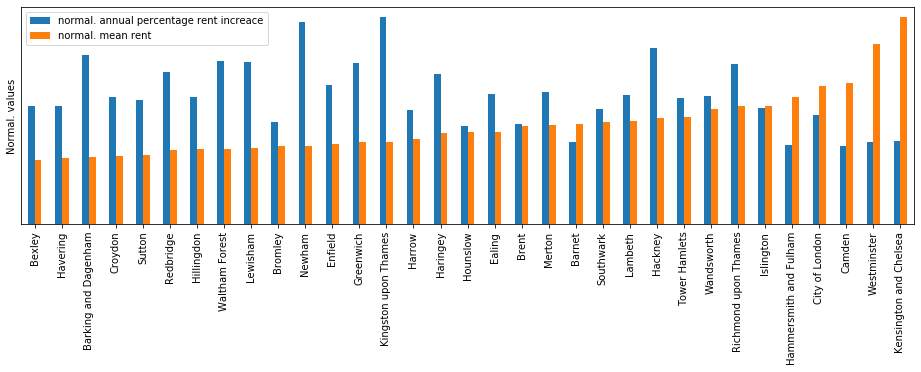

In [1737]:
fig, ax = plt.subplots(nrows=1,figsize = (16,4))
(rent_summary_normal[["meanPctChgRent","meanRent"]].sort_values("meanRent",ascending=True)).plot.bar(logy=False,ax=ax)
ax.legend(["normal. annual percentage rent increace", "normal. mean rent"])
ax.set_yticks([])
ax.set_ylabel("Normal. values")

This is interesting, as we can see that the rent price growth is signifcantly lower at expensive boroughs, such as kensington, westminster,...  
We can cluser these into <b>rich/ balanced and developing</b> boroughs.

In [1749]:
rent_summary_normal.head()

,annualRentChange,annualVolativity,meanRent,meanPctChgRent,volPctRent,Prediction_3Y,Prediction_5Y,Prediction_10Y
Barking and Dagenham,0.602090,0.186064,0.326568,0.817267,0.388000,0.339003,0.352366,0.390309
Barnet,0.435054,0.287071,0.486860,0.396111,0.401541,0.486667,0.486470,0.485958
Bexley,0.402114,0.136158,0.312730,0.569977,0.296496,0.317537,0.322556,0.336077
Brent,0.522142,0.214360,0.476190,0.486055,0.306554,0.479876,0.483686,0.493772
Bromley,0.422718,0.142956,0.377226,0.496736,0.258075,0.380512,0.383913,0.392934


In [1756]:
from sklearn import metrics
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
kclusters =3
kmeans = KMeans(n_clusters=kclusters, random_state=1).fit(rent_summary_normal[["meanRent","meanPctChgRent"]])
kmeans.fit(rent_summary_normal)

kmeans.labels_

array([1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 2, 0, 1,
       1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 2])

In [1757]:
rent_summary.insert(0, 'Cluster Labels', kmeans.labels_)

In [1758]:
# create map
rent_map_clusters  = folium.Map(location=[ldn_latitude, ldn_longitude], zoom_start=10)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

rent_map_clusters.choropleth(
    geo_data=london_geo,
    data=rent_summary,
    columns=['Borough',"Cluster Labels"],
    key_on='feature.properties.name',
    fill_color='YlGnBu', 
    fill_opacity=0.5, 
    line_opacity=0.5
)
for lat, lng, borough in zip(rent_summary['Latitude'], rent_summary['Longitude'], rent_summary['Borough']):
    label = '{}'.format(borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(rent_map_clusters)  

rent_map_clusters



The darkest areas: West minster and the Kengsinton are clustered to rich borought. Yellow areas are the balance areas and the Blue areas are the developing boroughs.

Another interesting fact are the prediction of the rental cost. Below i plot the prediciton over 3, 5 and 10 year in relative terms.  
It is clear to see that rich borough remain rich over the time. In the emerging boroughs, some develops faster than the others into the balanced boroughs.

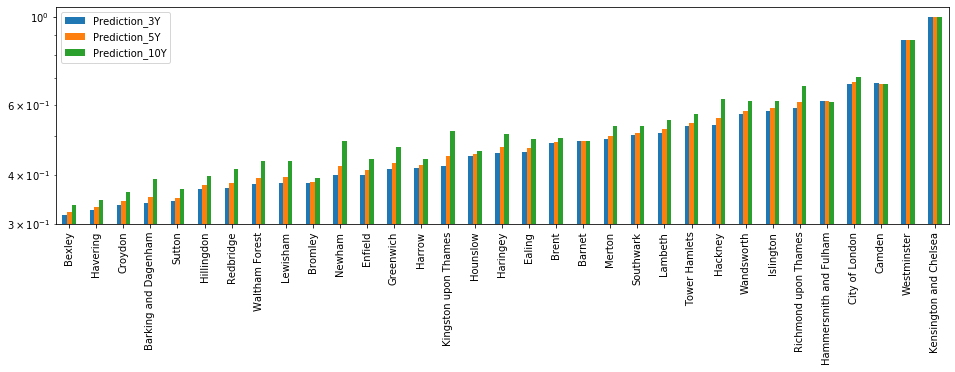

In [1695]:
fig, ax = plt.subplots(figsize=(16,4))
(rent_summary_normal[["Prediction_3Y","Prediction_5Y","Prediction_10Y"]].sort_values("Prediction_3Y")).plot.bar(logy=True,ax=ax)

## Venues

In [1760]:
print('There are {} uniques categories.'.format(len(ldn_venues['Venue Category'].unique())))

There are 345 uniques categories.


These are too many categories. Let us replace them by a more general categories. We will categorise various restaurant type into the same one, for example.

In [1764]:
venCateindex = np.concatenate(
    [np.where(ldn_venues['Venue Category'].str.contains(cate)==True)[0] for cate in ["Theater"]])
ldn_venues['Venue Category'][venCateindex]=["Theater" for i in venCateindex]

venCateindex = np.concatenate(
    [np.where(ldn_venues['Venue Category'].str.contains(cate)==True)[0] for cate in ["Station","Stop","Boat"]])
ldn_venues['Venue Category'][venCateindex]=["Transport" for i in venCateindex]

venCateindex = np.concatenate(
    [np.where(ldn_venues['Venue Category'].str.contains(cate)==True)[0] for cate in ["Bakery","Restaurant","Bistro","Steakhouse","Gastropub"]])
ldn_venues['Venue Category'][venCateindex]=["Restaurant" for i in venCateindex]

venCateindex = np.concatenate(
    [np.where(ldn_venues['Venue Category'].str.contains(cate)==True)[0] for cate in ["Burger","BBQ","Chicken","Pizza","Food" , "Sandwich" ]])
ldn_venues['Venue Category'][venCateindex]=["Fastfood" for i in venCateindex]

venCateindex = np.concatenate(
    [np.where(ldn_venues['Venue Category'].str.contains(cate)==True)[0] for cate in ["Grocery","market"]])
ldn_venues['Venue Category'][venCateindex]=["Grocery" for i in venCateindex]

venCateindex = np.concatenate(
    [np.where(ldn_venues['Venue Category'].str.contains(cate)==True)[0] for cate in ["Coff","Caf"]])
ldn_venues['Venue Category'][venCateindex]=["Cafe" for i in venCateindex]

venCateindex = np.concatenate(
    [np.where(ldn_venues['Venue Category'].str.contains(cate)==True)[0] for cate in ["Club","Bar","Pub","Nightclub"]])
ldn_venues['Venue Category'][venCateindex]=["Pub/Bar" for i in venCateindex]

venCateindex = np.concatenate(
    [np.where(ldn_venues['Venue Category'].str.contains(cate)==True)[0] for cate in ["Exhibit","Souv","Historic","Landmark","Museum","Lookout"]])
ldn_venues['Venue Category'][venCateindex]=["Tourism" for i in venCateindex]

venCateindex = np.concatenate(
    [np.where(ldn_venues['Venue Category'].str.contains(cate)==True)[0] for cate in ["Store","Shop"]])
ldn_venues['Venue Category'][venCateindex]=["Store" for i in venCateindex]

venCateindex = np.concatenate(
    [np.where(ldn_venues['Venue Category'].str.contains(cate)==True)[0] for cate in ["Park","Forest","Garden"]])
ldn_venues['Venue Category'][venCateindex]=["Nature" for i in venCateindex]

C:\Users\X\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\X\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
C:\Users\X\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back

In [1765]:
print('We left with {} uniques categories.'.format(len(ldn_venues['Venue Category'].unique())))

We left with 141 uniques categories.


Let us do some statistics on some major categories.  
For each borough we need the number of venues for each cathegory.

In [1777]:
ldn_venues_summary = ldn_venues.groupby("Borough").count()["index"].to_frame()

In [1790]:
for cate in ldn_venues["Venue Category"].unique():
    ldn_venues_summary[cate] = ldn_venues[ldn_venues["Venue Category"]==cate].groupby("Borough").count()["index"]

In [1792]:
ldn_venues_summary=ldn_venues_summary.replace(np.nan,0)

In [1794]:
ldn_venues_summary.rename(columns={'index':'Total'}, inplace=True)

In [1796]:
ldn_venues_summary.head()

,Total,Store,Gym / Fitness Center,Restaurant,Cafe,Transport,Pub/Bar,Fastfood,Grocery,Platform,...,Street Art,Fountain,Skating Rink,Wings Joint,Used Bookstore,Outdoor Sculpture,Arcade,Neighborhood,Opera House,Currywurst Joint
Borough,,,,,,,,,,,,,,,,,,,,,
Barking and Dagenham,26,5,0.0,3,1,1,1,2.0,6,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Barnet,168,13,6.0,50,27,5,15,11.0,10,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Bexley,44,7,0.0,7,5,3,8,1.0,6,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Brent,94,14,2.0,24,11,5,6,9.0,7,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Bromley,93,13,1.0,19,8,9,10,6.0,9,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


These are the most frequency categories across london.

In [2239]:
ldn_venues_summary.sum().sum()

12094.0

In [2244]:
top10_catedf=ldn_venues_summary.sum().sort_values(ascending=False).to_frame().iloc[1:11]
(top10_catedf*100)/(ldn_venues_summary.sum().sum())

,0
Restaurant,14.023483
Pub/Bar,6.201422
Store,6.151811
Cafe,5.291880
Fastfood,3.381842
Grocery,1.876964
Hotel,1.852158
Transport,1.298164
Gym / Fitness Center,0.818588
Nature,0.735902


## Combine all data frames

We need to also add a population density and supermarkets density.

In [1870]:
ldn_data = pd.concat([smarketdf,populdf,areadf, rent_summary,ldn_venues_summary[top10_catedf.index.tolist()]], axis=1)
ldn_data["PopulationDensity"]=ldn_data["Population"]/ldn_data["Area"]
ldn_data["SupermarketDensity"]=ldn_data["Nr of Supermarkets"]/ldn_data["Area"]
ldn_data=ldn_data.drop("Borough",axis=1)
ldn_data["Borough"]=ldn_data.index.values
ldn_data

,Nr of Supermarkets,Population,Area,Cluster Labels,Latitude,Longitude,annualRentChange,annualVolativity,meanRent,meanPctChgRent,...,Cafe,Fastfood,Grocery,Hotel,Transport,Gym / Fitness Center,Nature,PopulationDensity,SupermarketDensity,Borough
Borough,,,,,,,,,,,,,,,,,,,,,
Barking and Dagenham,269,185974.0,36.078561,1,51.554117,0.150504,73.041458,43.339662,978.284623,0.074663,...,1,2.0,6,2.0,1,0.0,0.0,5154.695653,7.455952,Barking and Dagenham
Barnet,859,356064.0,86.738765,1,51.612523,-0.211444,52.777863,66.867174,1458.462446,0.036187,...,27,11.0,10,4.0,5,6.0,2.0,4105.015786,9.903300,Barnet
Bexley,270,231975.0,60.553966,1,51.461969,0.145699,48.781769,31.715167,936.829586,0.052071,...,5,1.0,6,1.0,3,0.0,0.0,3830.880363,4.458833,Bexley
Brent,967,311279.0,43.252833,1,51.563826,-0.275760,63.342757,49.930540,1426.499681,0.044404,...,11,9.0,7,4.0,5,2.0,2.0,7196.730905,22.356917,Brent
Bromley,592,309225.0,150.141720,1,51.366857,0.061709,51.281253,33.298686,1130.038838,0.045380,...,8,6.0,9,0.0,9,1.0,2.0,2059.554129,3.942941,Bromley
Camden,2776,220387.0,21.755916,0,51.542827,-0.162488,70.856706,121.721035,2042.465001,0.034692,...,93,40.0,14,23.0,7,11.0,7.0,10129.980278,127.597477,Camden
City of London,841,7358.0,2.900000,0,51.508090,-0.076208,96.687419,116.703940,2005.614213,0.048208,...,50,20.0,3,11.0,1,17.0,4.0,2537.241379,290.000000,City of London
Croydon,979,363453.0,86.531566,1,51.355059,-0.064314,55.608960,32.832093,988.061848,0.056281,...,11,7.0,4,4.0,2,0.0,3.0,4200.236020,11.313790,Croydon
Ealing,878,338429.0,55.529386,1,51.525071,-0.314312,76.840655,46.648746,1339.568854,0.057362,...,9,5.0,8,0.0,6,2.0,0.0,6094.592914,15.811448,Ealing


In [866]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

## Stats Plots

here let us have a closer look at some of category distributions.

### Population density

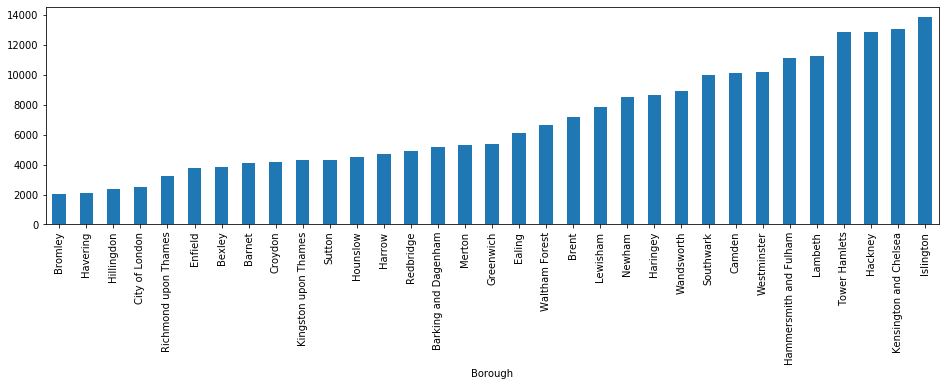

In [1845]:
fig, ax = plt.subplots(nrows=1,figsize=(16,4))
(ldn_data.sort_values("PopulationDensity"))["PopulationDensity"].plot.bar(ax=ax,logy=False)


In [1846]:
popDen_map_london = folium.Map(location=[ldn_latitude, ldn_longitude], zoom_start=10)

popDen_map_london.choropleth(
    geo_data=london_geo,
    data=ldn_data,
    columns=['Borough',"PopulationDensity"],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.5, 
    line_opacity=0.5
)

for lat, lng, borough in zip(ldn_data['Latitude'], ldn_data['Longitude'], rent_summary['Borough']):
    label = '{}'.format(borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(popDen_map_london)  
popDen_map_london

### Supermarkt density

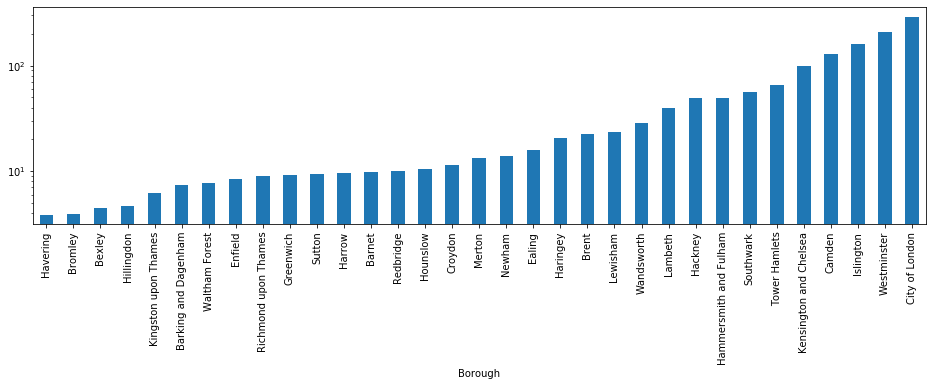

In [1849]:
fig, ax = plt.subplots(nrows=1,figsize=(16,4))
(ldn_data.sort_values("SupermarketDensity"))["SupermarketDensity"].plot.bar(ax=ax,logy=True)


In [1850]:
smDen_map_london = folium.Map(location=[ldn_latitude, ldn_longitude], zoom_start=10)

smDen_map_london.choropleth(
    geo_data=london_geo,
    data=ldn_data,
    columns=['Borough',"SupermarketDensity"],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.5, 
    line_opacity=0.5
)

for lat, lng, borough in zip(ldn_data['Latitude'], ldn_data['Longitude'], rent_summary['Borough']):
    label = '{}'.format(borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(smDen_map_london)  
smDen_map_london

## Relationships to rental data

We are interested in the relative value between the borough. Here, we will use the <b>pairwise correlation</b> and <b>multidimensional regression</b>. As features have different values, it is hard to compare them. Hence, let us standardize them.

In [1871]:
from scipy import stats
def r2(x, y):
    return stats.pearsonr(x, y)

In [2153]:
ldn_data_norm = ldn_data.iloc[:,:-1]/(ldn_data.iloc[:,:-1].max())

### Pairwise correlation

Let us first visually examine the correlations.

In [ ]:
columnlist=["meanRent","meanPctChgRent","PopulationDensity","SupermarketDensity"]+top10_catedf.index.tolist()
#sns.pairplot(ldn_data_norm[columnlist], kind="reg")

let us use p-value to determine the goodness of the fit as a rough guidline.

In [2161]:
dim = len(columnlist)
p_matrix = np.zeros((dim, dim))
for x, itemX in enumerate(columnlist):
    for y, itemY in enumerate(columnlist):
        res = r2(ldn_data_norm[itemX],ldn_data_norm[itemY])
        p_matrix[y,x]=res[1]

And the correlation matrix

In [2162]:
corrDF = ldn_data_norm[columnlist].corr()

In [2163]:
p_matrixDF=pd.DataFrame(p_matrix,index=columnlist)
p_matrixDF.columns=columnlist
p_matrixDF

,meanRent,meanPctChgRent,PopulationDensity,SupermarketDensity,Restaurant,Pub/Bar,Store,Cafe,Fastfood,Grocery,Hotel,Transport,Gym / Fitness Center,Nature
meanRent,1.543639e-239,0.002257,0.000541,3.842026e-06,2.887128e-06,3.540658e-06,9.679650e-05,9.506965e-07,2.966305e-06,0.000020,1.523213e-05,0.655649,1.840014e-07,3.756168e-06
meanPctChgRent,2.256509e-03,0.000000,0.497825,2.366512e-02,2.043878e-02,3.096213e-02,4.191965e-02,6.505045e-03,2.729008e-02,0.005774,1.982577e-02,0.934149,1.686739e-03,3.071549e-03
PopulationDensity,5.412393e-04,0.497825,0.000000,4.187412e-02,7.831978e-02,3.906463e-02,1.018237e-01,3.205609e-02,6.327510e-03,0.010353,8.958099e-02,0.059225,2.187936e-02,2.580270e-02
SupermarketDensity,3.842026e-06,0.023665,0.041874,0.000000e+00,2.385900e-06,5.414136e-07,6.780268e-04,2.009797e-07,2.307104e-06,0.044299,1.774419e-04,0.589795,1.995254e-16,3.785539e-05
Restaurant,2.887128e-06,0.020439,0.078320,2.385900e-06,0.000000e+00,1.066274e-24,1.168700e-19,4.276608e-16,7.072409e-17,0.000010,9.156360e-22,0.904194,1.488947e-06,3.327278e-12
Pub/Bar,3.540658e-06,0.030962,0.039065,5.414136e-07,1.066274e-24,1.543639e-239,8.634643e-16,2.006714e-16,6.679855e-19,0.000009,9.849374e-16,0.959189,8.860967e-07,3.481291e-13
Store,9.679650e-05,0.041920,0.101824,6.780268e-04,1.168700e-19,8.634643e-16,0.000000e+00,2.208744e-11,3.475029e-14,0.000005,2.525416e-24,0.969610,3.919981e-04,1.214253e-10
Cafe,9.506965e-07,0.006505,0.032056,2.009797e-07,4.276608e-16,2.006714e-16,2.208744e-11,0.000000e+00,7.331954e-18,0.000002,8.874967e-12,0.801700,1.072831e-08,9.177528e-11
Fastfood,2.966305e-06,0.027290,0.006328,2.307104e-06,7.072409e-17,6.679855e-19,3.475029e-14,7.331954e-18,0.000000e+00,0.000001,1.556705e-13,0.648566,8.709602e-07,7.527423e-13
Grocery,2.010398e-05,0.005774,0.010353,4.429886e-02,1.044950e-05,8.965605e-06,5.463543e-06,1.560801e-06,1.182435e-06,0.000000,1.118647e-05,0.155844,1.111115e-02,1.737383e-05


let us now look at fist at 1 dimensional correlation. 

In [2164]:
getcorrDF = lambda label1: pd.concat([corrDF[label1],p_matrixDF[label1]],axis=1)

#### Mean rent

In [2165]:
corrSumy=getcorrDF("meanRent")
corrSumy.columns=["Correlation","p-value"]
corrSumy.sort_values("p-value",ascending=True)

,Correlation,p-value
meanRent,1.000000,1.543639e-239
Gym / Fitness Center,0.767801,1.840014e-07
Cafe,0.738031,9.506965e-07
Restaurant,0.715363,2.887128e-06
Fastfood,0.714782,2.966305e-06
Pub/Bar,0.710950,3.540658e-06
Nature,0.709658,3.756168e-06
SupermarketDensity,0.709161,3.842026e-06
Hotel,0.676878,1.523213e-05
Grocery,0.669854,2.010398e-05


This shows that the average rent price is positively correlated with the most of the features  
- Cafes, Fastfood, Restaurants, Pub/Bar, Stores and population. 

This makes sense, as all factors reprents options for better living.  

However, it is less correlated with transport.

Let us look some of the correlations plot, just to be sure.

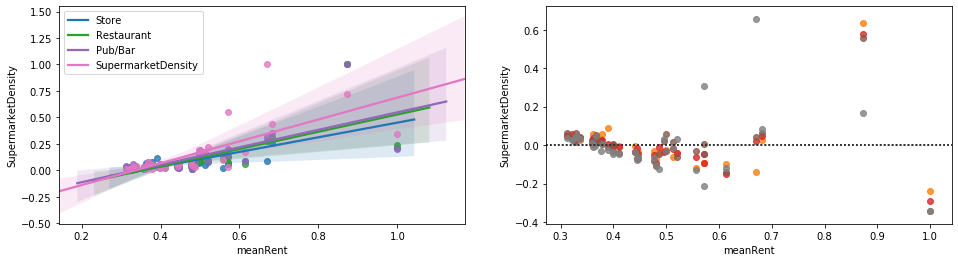

In [2170]:
fig, ax=plt.subplots(ncols=2, figsize=(16,4))
featurelist = ["Store", "Restaurant","Pub/Bar", "SupermarketDensity"]#, "PopulationDensity"]
for feature in featurelist:
    sns.regplot(x="meanRent",y=feature,data=ldn_data_norm,ax=ax[0])
    sns.residplot(x="meanRent",y=feature,data=ldn_data_norm,ax=ax[1])
ax[0].legend(featurelist)

In both cases, a linear regression doesnt represent the feature very well, as also observed in the residual plot. But it indicates the trend.  

Interestingly, there seems to be an outlier in each set. Let us look who they are:

In [2171]:
[ldn_data[ldn_data_norm[feature]>0.75][feature].index for feature in featurelist]

[Index(['Westminster'], dtype='object', name='Borough'),
 Index(['Westminster'], dtype='object', name='Borough'),
 Index(['Westminster'], dtype='object', name='Borough'),
 Index(['City of London'], dtype='object', name='Borough')]

This shows that Westminster has particularly a lot Cafe/... 

#### Rent pct change

In [2172]:
corrSumy=getcorrDF("meanPctChgRent")
corrSumy.columns=["Correlation","p-value"]
corrSumy.sort_values("p-value",ascending=True)

,Correlation,p-value
meanPctChgRent,1.000000,0.000000
Gym / Fitness Center,-0.525504,0.001687
meanRent,-0.513200,0.002257
Nature,-0.499645,0.003072
Grocery,-0.470069,0.005774
Cafe,-0.464185,0.006505
Hotel,-0.403672,0.019826
Restaurant,-0.401861,0.020439
SupermarketDensity,-0.393009,0.023665
Fastfood,-0.384181,0.027290


The first impression from this is that the rent increase is negatively correlated with the average rent. This mean, the more expensive the rent already is, there is less room for rent increaments.  
Interestingly, also negatively to Cafe place:  
- This could mean that larger rent change indicates development, ppl are less profound for buying cofes. (Kind of luxery product)

Before moving on, let us compare visually the correlation between Cafe and restaurant, as the p values are quite different.

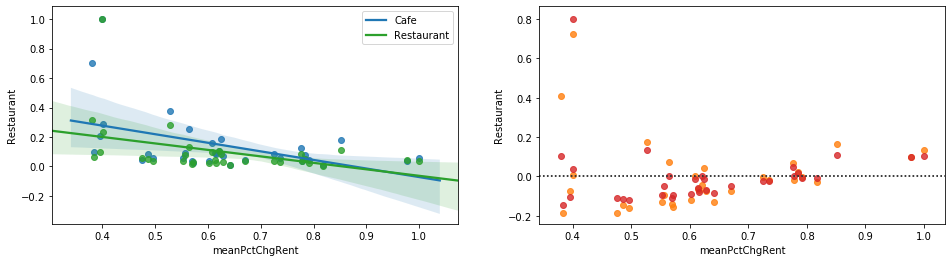

In [2174]:
fig, ax=plt.subplots(ncols=2, figsize=(16,4))
featurelist = ["Cafe", "Restaurant"]#, "PopulationDensity"]
for feature in featurelist:
    sns.regplot(x="meanPctChgRent",y=feature,data=ldn_data_norm,ax=ax[0])
    sns.residplot(x="meanPctChgRent",y=feature,data=ldn_data_norm,ax=ax[1])
ax[0].legend(featurelist)

### Multi-dimensional Linear regression

We want to look at the the contribution of individual area to the mean rent and rent increase in percentage.

#### Average rent 

In [2211]:
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression

In [2212]:
X = ldn_data_norm[ldn_data_norm.columns.drop(["meanRent","Nr of Supermarkets","Prediction_10Y",
                                    "Prediction_5Y","Prediction_3Y",
                                            "Population","Area","Latitude","Longitude",
                                            "annualVolativity","annualRentChange","meanPctChgRent","volPctRent","Cluster Labels"])]
y= ldn_data_norm["meanRent"]

In [2213]:
reg = LinearRegression().fit(X, y)

In [2214]:
reg.score(X, y)

0.8225669184676494

In [2215]:
multiRegRes_meanrent=pd.DataFrame({"Borough":X.columns.values ,"coef":(reg.coef_),"Contribution":(reg.coef_)**2*100/(((reg.coef_)**2).sum())}).sort_values("Contribution",ascending=False)

In [2216]:
multiRegRes_meanrent

,Borough,coef,Contribution
0,Restaurant,0.915615,45.498550
2,Store,-0.490863,13.076540
1,Pub/Bar,-0.458589,11.413534
4,Fastfood,-0.401336,8.741550
6,Hotel,0.343525,6.404547
5,Grocery,0.338717,6.226530
8,Gym / Fitness Center,0.220614,2.641427
9,Nature,0.190322,1.965848
10,PopulationDensity,0.178402,1.727321
3,Cafe,-0.166438,1.503407


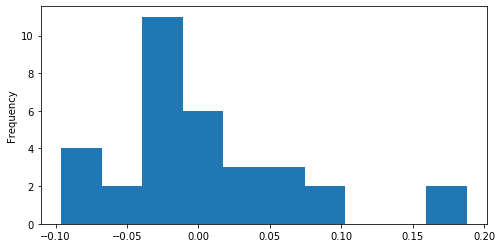

In [2217]:
fig, ax=plt.subplots(figsize=(8,4))
(y-reg.predict(X)).plot.hist(ax=ax,bins=10)

#### Percentage rent increase

In [2218]:
X = ldn_data_norm[ldn_data_norm.columns.drop(["meanPctChgRent","Nr of Supermarkets","Prediction_10Y",
                                    "Prediction_5Y","Prediction_3Y",
                                            "Population","Area","Latitude","Longitude",
                                            "annualVolativity","annualRentChange","meanRent","volPctRent","Cluster Labels"])]
y= ldn_data["meanPctChgRent"]

In [2219]:
X_scale = preprocessing.scale(X)
y_scale = preprocessing.scale(y)

In [2220]:
reg = LinearRegression().fit(X, y)

In [2221]:
reg.score(X, y)

0.6359726707961386

In [2222]:
multiRegRes_pctrentchg=pd.DataFrame({"Borough":X.columns.values ,"coef":(reg.coef_),"Contribution":(reg.coef_)**2*100/(((reg.coef_)**2).sum())}).sort_values("Contribution",ascending=False)

In [2223]:
multiRegRes_pctrentchg

,Borough,coef,Contribution
0,Restaurant,0.245041,56.666650
6,Hotel,-0.173478,28.401155
8,Gym / Fitness Center,-0.072222,4.922467
4,Fastfood,0.060769,3.485136
1,Pub/Bar,-0.047085,2.092263
9,Nature,-0.045768,1.976849
5,Grocery,-0.036227,1.238532
11,SupermarketDensity,0.020476,0.395692
10,PopulationDensity,0.018526,0.323918
2,Store,0.016404,0.253938


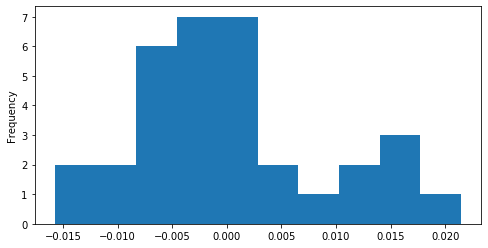

In [2224]:
fig, ax=plt.subplots(figsize=(8,4))
(y-reg.predict(X)).plot.hist(ax=ax,bins=10)

### Comparing

In [2225]:
multiRegRes_pctrentchg.set_index("Borough",drop=True,inplace=True)
multiRegRes_meanrent.set_index("Borough",drop=True,inplace=True)

In [2226]:
multiRegRes_meanrent

,coef,Contribution
Borough,,
Restaurant,0.915615,45.498550
Store,-0.490863,13.076540
Pub/Bar,-0.458589,11.413534
Fastfood,-0.401336,8.741550
Hotel,0.343525,6.404547
Grocery,0.338717,6.226530
Gym / Fitness Center,0.220614,2.641427
Nature,0.190322,1.965848
PopulationDensity,0.178402,1.727321


In [2227]:
multiRegRes = pd.concat([multiRegRes_pctrentchg["coef"],multiRegRes_meanrent["coef"]],axis=1)
multiRegRes.columns = ["pctRentChg","meanRent"]

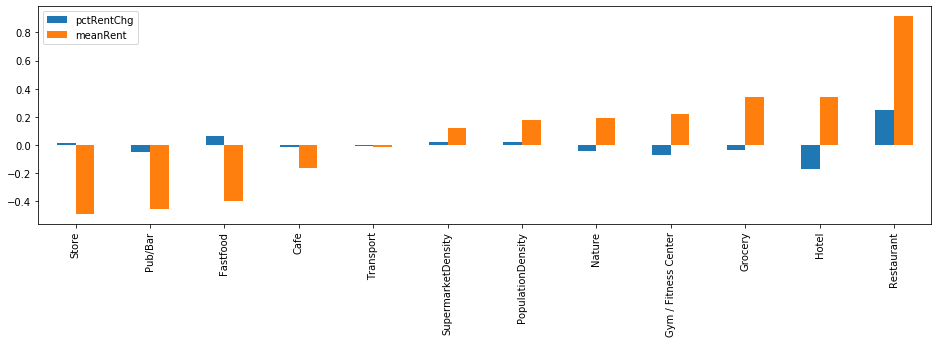

In [2230]:
fig, ax = plt.subplots(figsize=(16,4))
multiRegRes.sort_values("meanRent").plot.bar(ax=ax)

## Looking for the right area to open 

Let us now normalise all the data and look for the patterns in the relative distribution in the features.

In [2231]:
ldn_data_norm = ldn_data.iloc[:,:-1]/(ldn_data.iloc[:,:-1].max())

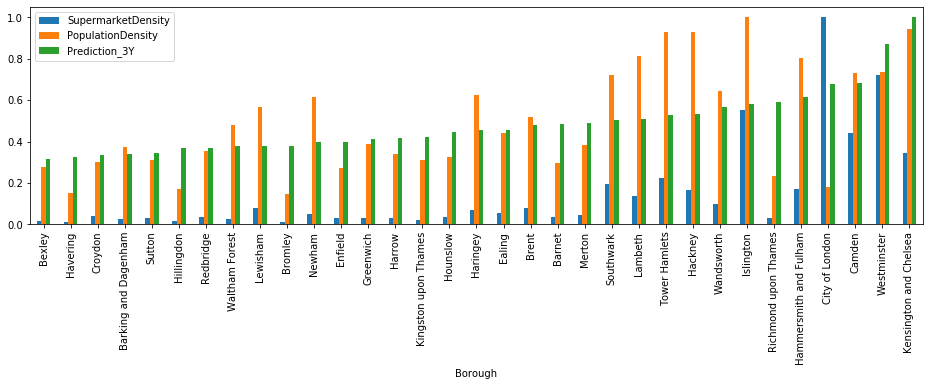

In [2232]:
fig, ax = plt.subplots(nrows=1,figsize=(16,4))
(ldn_data_norm.sort_values("Prediction_3Y"))[["SupermarketDensity","PopulationDensity","Prediction_3Y"]].plot.bar(logy=False,ax=ax)

Relatively speaking, Kensington is the most expensive borough to go to an has few supermarket opportunities.  
Westminster would be idea, as the population density is high (ignoring the tourists) and also a good portion of supermarkets.  
Boroughs ranging from Candem to Southwark seem to be all suitable candidates, as the population density are high an moderate rental expenses over the next 3 years.  
The rest boroughs have relatively low shopping opportunities.

Lets see if we can cluster these together and compare the results with the previous analysis

In [2068]:
clusterdata = ldn_data[["SupermarketDensity","Prediction_3Y","Prediction_5Y","Prediction_10Y","PopulationDensity"]]
clusterdata=pd.DataFrame(preprocessing.scale(clusterdata),index=clusterdata.index.values,columns=["SupermarketDensity","Prediction_3Y","Prediction_5Y","Prediction_10Y","PopulationDensity"])

In [2069]:
from sklearn import metrics
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
avdist = []
K = range(1,10)
for kclusters in K:
    kmeans = KMeans(n_clusters=kclusters, random_state=1).fit(clusterdata)
    kmeans.fit(clusterdata)
    avdist.append(sum(np.min(cdist(clusterdata, kmeans.cluster_centers_, 'euclidean'), axis=1)) / clusterdata.shape[0])




# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([1, 5, 1, 4, 1, 6, 3, 1, 5, 5, 5, 0, 0, 4, 5, 1, 1, 5, 6, 2, 5, 0,
       4, 5, 4, 1, 8, 0, 1, 0, 4, 0, 7])

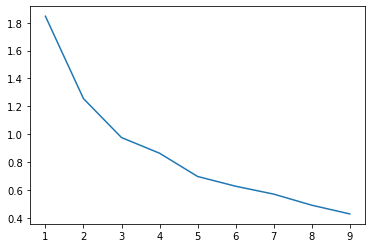

In [2070]:
plt.plot(K,avdist)

The ideal number of clusters seems to be around 3.

In [2072]:
#clusterdata.drop(columns=['Cluster Labels',"Borough"],inplace=True)
kclusters =3
kmeans = KMeans(n_clusters=kclusters, random_state=1).fit(clusterdata)
kmeans.fit(clusterdata)

kmeans.labels_

array([1, 1, 1, 1, 1, 0, 2, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 2, 1, 0,
       1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 2])

In [2073]:
clusterdata.insert(0, 'Cluster Labels', kmeans.labels_)


In [2074]:
clusterdata["Borough"] = clusterdata.index.values

In [2075]:
# create map
map_clusters  = folium.Map(location=[ldn_latitude, ldn_longitude], zoom_start=10)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

map_clusters.choropleth(
    geo_data=london_geo,
    data=clusterdata,
    columns=['Borough',"Cluster Labels"],
    key_on='feature.properties.name',
    fill_color='YlGnBu', 
    fill_opacity=0.5, 
    line_opacity=0.5
)
for lat, lng, borough in zip(ldnBoroughDF['Latitude'], ldnBoroughDF['Longitude'], ldnBoroughDF['Borough']):
    label = '{}'.format(borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_clusters)  

map_clusters



In [2078]:
clusterRes = clusterdata[clusterdata["Cluster Labels"]==0]

In [2079]:
clusterRes

,Cluster Labels,SupermarketDensity,Prediction_3Y,Prediction_5Y,Prediction_10Y,PopulationDensity,Borough
Camden,0,1.314185,1.285475,1.232642,1.067421,0.931625,Camden
Hackney,0,0.094863,0.313556,0.409551,0.695665,1.724042,Hackney
Hammersmith and Fulham,0,0.105663,0.838789,0.782199,0.610282,1.218024,Hammersmith and Fulham
Islington,0,1.825921,0.620792,0.627118,0.632685,1.994531,Islington
Lambeth,0,-0.042490,0.150741,0.162624,0.190587,1.264634,Lambeth
Richmond upon Thames,0,-0.522560,0.687893,0.776542,1.029926,-1.026085,Richmond upon Thames
Southwark,0,0.217467,0.109412,0.098152,0.058947,0.892039,Southwark
Tower Hamlets,0,0.341660,0.288468,0.299931,0.324734,1.708297,Tower Hamlets
Wandsworth,0,-0.221769,0.541778,0.566467,0.626835,0.597808,Wandsworth


Lets us see how many elements overlap in both outcomes.

In [2099]:
set1=set(ldn_data_norm.sort_values("Prediction_3Y").iloc[-12:-2].index.tolist())
set2 = set(clusterRes.index.tolist())

In [2100]:
set1.intersection(set2)

{'Camden',
 'Hackney',
 'Hammersmith and Fulham',
 'Islington',
 'Lambeth',
 'Richmond upon Thames',
 'Southwark',
 'Tower Hamlets',
 'Wandsworth'}

# Results

Our analysis have shown that the most expensive borough is the Kensington and Chelsea, which is followed by Westminster. Boroughs located around these two appear to fall into the next rent price class. However, rent cost seems to be in general higher in the west than in the east. 

In contrast, east(north) and south(west) London appear to experience a larger annual rent increase. This trend indicate an higher demand in housing and show potential future development. Particular heavily developing boroughs are Kingston, Hackney, Newham and Barking.

Looking at the pairwise correlations between the top 10 venue categories and the rent movement, we observe that the average rent price of each borough is positively correlation with the number of the venues, as expected. Boroughs with high rent increase is negative correlated. 

On the other hand, using multi-dimensional linear regression, we found out that the mean rent price is mostly driven by the number of hotels, Grocery, Gym, Nature, which are all indications of balanced living options. But the rent increase is mostly driven by the presence of restaurants and fastfood restaurants in the absent if the balanced living options.

For both features regardin the rent cost, supermarket doesnt really affect the price. Because of this, we narrow down our borough selections based on the following 3 features for our client:
- predicted rent cost for the next 3 years  
lower cost
- supermarket density  
shopping opportunities  
- population density  
Larger exposure to the public.


K-mean clustering has suitably classified all areas into three groups of boroughs:
- Westminster, Kensington are over the price budged.
- Camden, Hackney, Hammersmith and Fulham, Islington, Lambeth, Richmond upon Thames, Southwark, Tower Hamlets and Wandsworth are the most suitable boroughs with high population density, supermarket density and moderate rent cost.
- The rest are lack of shopping opportunities and low population density.

There are two expections:
- City of London is an outlier due to its low population, whereas the place is fully occupied by the business. This borough still offers good opportunity for our client, however on restricted hours.
- Richmond upon Thames is not well suited for clients business.

# Conclusion

Our analysis is capable of identify the venue opportunities in the each borough. After analysing individual borough, we recommend most of the boroughs in Zone 2 in London for cour client to open up their business. The boroughs with most balanced rent cost, supermarket density and population density are Southwark, Lambeth, Tower Hamlets and Hammersmith and Fulham. However, our clients has the option to go for more expensive boroughs at a cost of higher population density.